In [1]:
from ultralytics import YOLO
import pandas as pd
import torch
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# Links Consultados

- YOLO11 CustomDataset

https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolo11-object-detection-on-custom-dataset.ipynb#scrollTo=fUFNm4O0znB2

https://blog.roboflow.com/yolov11-how-to-train-custom-data/

https://medium.com/@estebanuri/training-yolov11-object-detector-on-a-custom-dataset-39bba09530ff

- Ultralytics Docs

https://docs.ultralytics.com/datasets/#steps-to-contribute-a-new-dataset

https://docs.ultralytics.com/guides/hyperparameter-tuning/

https://docs.ultralytics.com/guides/yolo-performance-metrics/

https://docs.ultralytics.com/guides/yolo-data-augmentation/

https://docs.ultralytics.com/reference/engine/model/#ultralytics.engine.model.Model

- GradCAM

https://github.com/jacobgil/pytorch-grad-cam

https://jacobgil.github.io/pytorch-gradcam-book/EigenCAM%20for%20YOLO5.html


In [2]:

# Verificação
gpu_disponivel = torch.cuda.is_available()
num_gpus = torch.cuda.device_count()

print(f"GPU Disponível: {gpu_disponivel}")
if gpu_disponivel:
    print(f"Número de GPUs: {num_gpus}")
    print(f"Nome da GPU: {torch.cuda.get_device_name(0)}")

# Configura o dispositivo que o PyTorch vai usar
device = torch.device('cuda:0' if gpu_disponivel else 'cpu')
print(f"O treinamento usará o dispositivo: {device}")

GPU Disponível: True
Número de GPUs: 1
Nome da GPU: NVIDIA GeForce GTX 1660
O treinamento usará o dispositivo: cuda:0


# Entendimento do Dataset

## Estrutura do dataset

data.yml -> Fornece o caminho para as fotos e os labels utilizados para treinamento e para validação, além das definições das classes

train -> pasta com as imagens e os labels para treinamento

    images -> Local onde as imagens estão
    labels -> txt com as informações dos labels e das boxes

valid -> pasta com as imagens e os labels para validação 

    images -> Local onde as imagens estão
    labels -> txt com as informações dos labels e das boxes

## Entendimento de como o dado está salvo

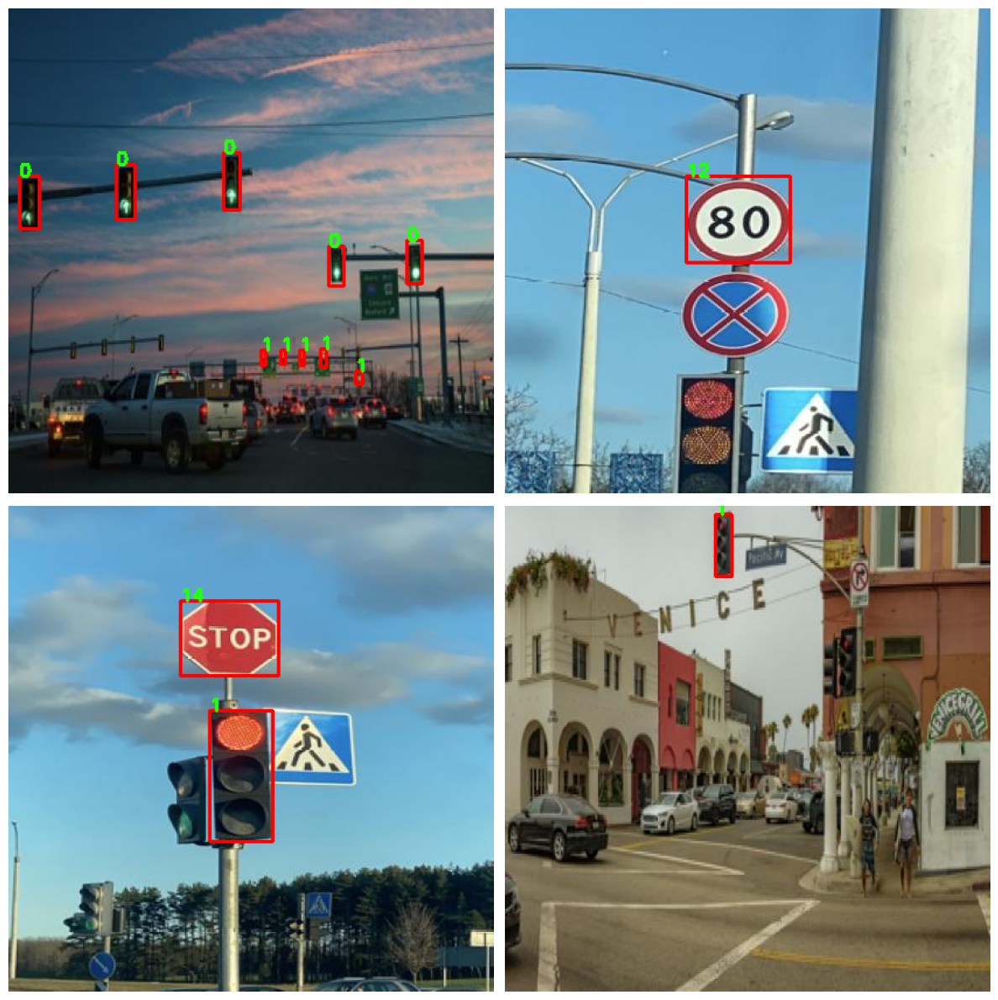

In [20]:
img1 = 'car/test/images/road43_png.rf.c576096fc5f0b00379321f94ddffcbc6.jpg'
img2 = 'car/test/images/road459_png.rf.90e8843192d53e6f83e48ef5a09736a3.jpg'
img3 = 'car/test/images/road822_png.rf.b3ba7f5457042a083bad8aac3fe5f819.jpg'
img4 = 'car/test/images/road28_png.rf.d0de3563c76ae8b60ecdaf41757d472b.jpg'

fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for i, img_str in enumerate([img1, img2, img3, img4]):
    label = str(img_str).replace('.jpg','.txt').replace('images','labels')
    img = cv2.imread(img_str)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    with open(label, 'r') as f:
        annotations = f.readlines()

    for annotation in annotations:
        class_id, x_center, y_center, width, height = map(float, annotation.split())
        img_height, img_width, _ = img.shape

        # Converte as coordenadas normalizadas para coordenadas absolutas
        x_center_abs = int(x_center * img_width)
        y_center_abs = int(y_center * img_height)
        width_abs = int(width * img_width)
        height_abs = int(height * img_height)

        # Calcula as coordenadas do canto superior esquerdo e inferior direito
        x1 = int(x_center_abs - width_abs / 2)
        y1 = int(y_center_abs - height_abs / 2)
        x2 = int(x_center_abs + width_abs / 2)
        y2 = int(y_center_abs + height_abs / 2)

        # Desenha o retângulo na imagem
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(img_rgb, str(int(class_id)), (x1, y1), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (36,255,12), 2)


    axes[i//2, i%2].imshow(img_rgb)
    axes[i//2, i%2].axis('off')
plt.tight_layout()
plt.axis('off') 
plt.show() 

### Distribuição dos Labels

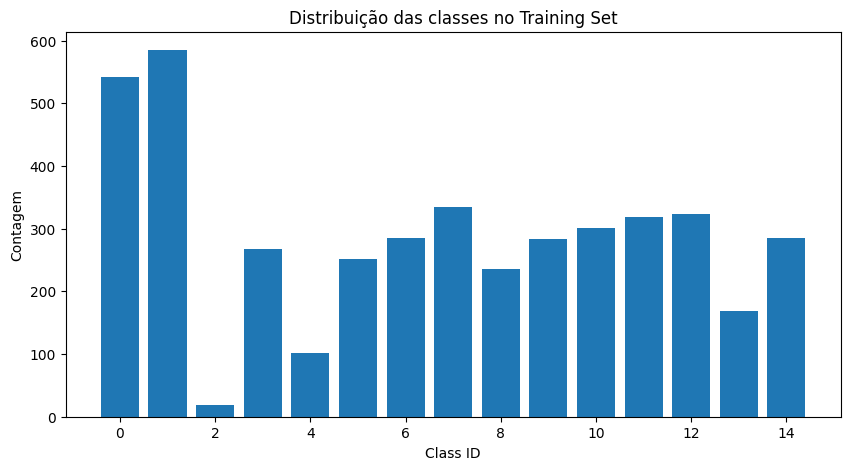

In [ ]:
dataset_path = 'car/train'
train_labels = os.listdir(f'{dataset_path}/labels')
labels_count = {}
for label in train_labels:
    with open(f'{dataset_path}/labels/{label}', 'r') as f:
        annotations = f.readlines()
        for ann in annotations:
            class_id = int(ann.split()[0])
            if class_id in labels_count:
                labels_count[class_id] += 1
            else:
                labels_count[class_id] = 1
labels_df = pd.DataFrame(list(labels_count.items()), columns=['Class ID', 'Count'])
labels_df = labels_df.sort_values(by='Class ID', ascending=False).reset_index(drop=True)


plt.figure(figsize=(10,5))
plt.bar(labels_df['Class ID'], labels_df['Count'])
plt.xlabel('Class ID')
plt.ylabel('Contagem')
plt.title('Distribuição das classes no Training Set')
plt.show()

# Treinando Modelo Inicial

In [3]:
model = YOLO('models/yolo11n.pt')

In [4]:
model.train(data='car/data.yaml', epochs=30, imgsz=640, batch=4, project='yolo-trafic-sign', name='yolo11n-custom', exist_ok=True, device='cuda', workers=2)

Ultralytics 8.3.204  Python-3.13.7 torch-2.8.0+cu128 CUDA:0 (NVIDIA GeForce GTX 1660, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=car/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=models/yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo11n-custom, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000024D8FA80C90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   

In [84]:
model = YOLO("yolo-trafic-sign/yolo11n-custom/weights/best.pt")

In [42]:
model.val()

Ultralytics 8.3.204  Python-3.13.7 torch-2.8.0+cu128 CUDA:0 (NVIDIA GeForce GTX 1660, 6144MiB)
YOLO11n summary (fused): 100 layers, 2,585,077 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 188.671.9 MB/s, size: 14.4 KB)
val: Scanning F:\Tuga\Faculdade\doc\Deep Learning\Tarefa 2\car\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 801/801 1.2Mit/s 0.0s0s
WARNING NMS time limit 2.800s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 51/51 1.2it/s 42.3s0.1s6
                   all        801        944      0.968      0.839      0.924      0.801
           Green Light         87        122      0.924      0.696      0.807      0.495
             Red Light         74        108      0.957      0.621      0.807      0.495
       Speed Limit 100         52         52      0.955      0.942      0.974      0.862
       Speed Limit 110         17         17      

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001D58CE66510>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   


0: 640x640 5 Green Lights, 9.6ms
Speed: 3.1ms preprocess, 9.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 1 Speed Limit 80, 32.3ms
Speed: 3.9ms preprocess, 32.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Red Lights, 1 Stop, 9.9ms
Speed: 4.0ms preprocess, 9.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 9.7ms
Speed: 3.8ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


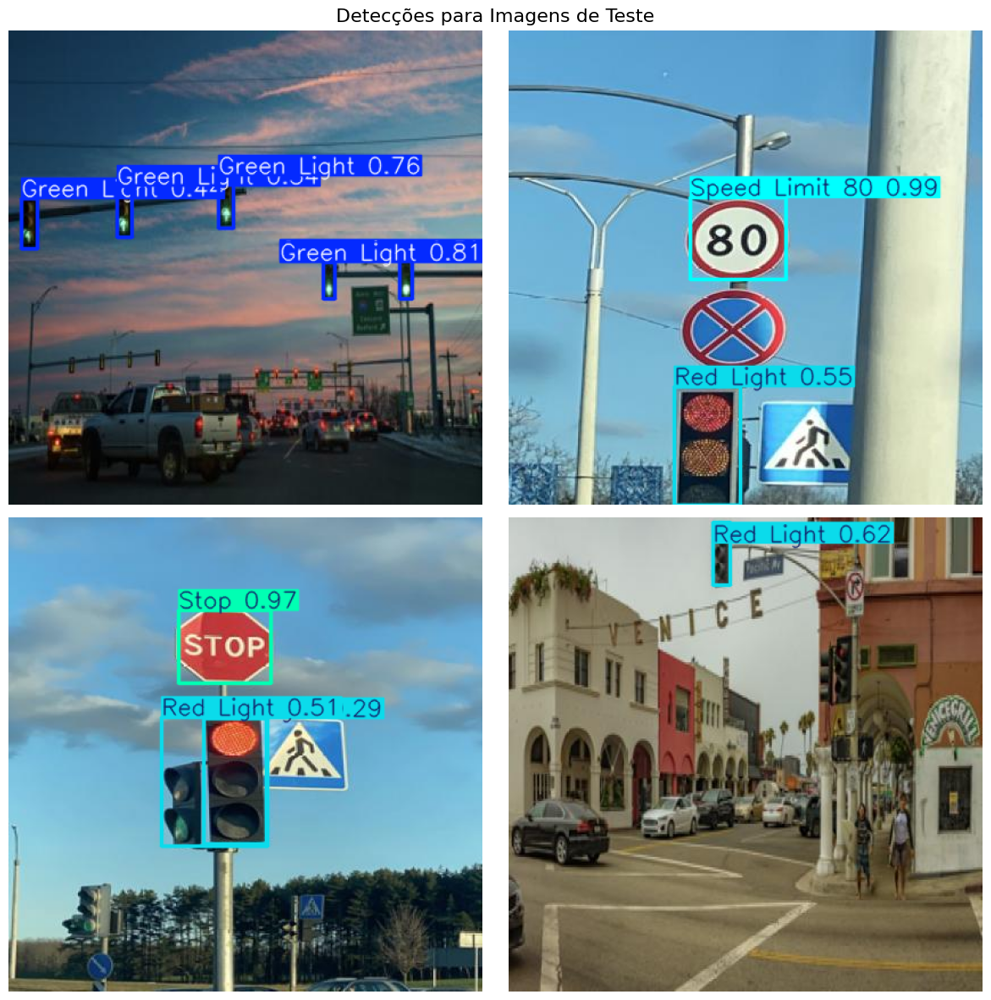

In [85]:
img1 = Image.open('car/test/images/road43_png.rf.c576096fc5f0b00379321f94ddffcbc6.jpg')
img2 = Image.open('car/test/images/road459_png.rf.90e8843192d53e6f83e48ef5a09736a3.jpg')
img3 = Image.open('car/test/images/road822_png.rf.b3ba7f5457042a083bad8aac3fe5f819.jpg')
img4 = Image.open('car/test/images/road28_png.rf.d0de3563c76ae8b60ecdaf41757d472b.jpg')

fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for i, img in enumerate([img1, img2, img3, img4]):
    # plt.figure(figsize=(8, 8))
    result = model.predict(img, conf=0.25)[0]
    im_array_bgr = result.plot()
    im_array_rgb = im_array_bgr[..., ::-1]
    axes[i//2, i%2].imshow(im_array_rgb)
    axes[i//2, i%2].axis('off')
fig.suptitle('Detecções para Imagens de Teste', fontsize=16)
plt.tight_layout()
plt.axis('off') 
plt.show() 

# Otimização do Modelo

In [38]:
# Initialize the YOLO model
model = YOLO("models/yolo11n.pt")

# Define search space
search_space = {
    "lr0": (1e-5, 1e-1),
    "degrees": (0.0, 45.0),
    'hsv_h': (0.0, 0.05),
    'hsv_s': (0.0, 0.05),
    'hsv_v': (0.0, 0.05),
    'translate': (0.0, 0.3),
    'scale': (0.5, 1.5),
    'shear': (0.0, 10.0),
    'perspective': (0.0, 0.001),
}

model.tune(
    data='car/data.yaml',
    epochs=30,
    imgsz=640, 
    batch=4,
    iterations=100,
    optimizer="AdamW",
    space=search_space,
    project='yolo-trafic-sign', 
    name='yolo11n-tuned', 
    exist_ok=True, 
    device='cuda', 
    workers=2,
    resume=True
)

Tuner: Initialized Tuner instance with 'tune_dir=F:\Tuga\Faculdade\doc\Deep Learning\Tarefa 2\yolo-trafic-sign\yolo11n-tuned2'
Tuner:  Learn about tuning at https://docs.ultralytics.com/guides/hyperparameter-tuning
Tuner: Starting iteration 1/70 with hyperparameters: {'lr0': 0.01, 'degrees': 0.0, 'hsv_h': 0.015}
Saved F:\Tuga\Faculdade\doc\Deep Learning\Tarefa 2\yolo-trafic-sign\yolo11n-tuned2\tune_scatter_plots.png
Saved F:\Tuga\Faculdade\doc\Deep Learning\Tarefa 2\yolo-trafic-sign\yolo11n-tuned2\tune_fitness.png

Tuner: 1/70 iterations complete  (1398.28s)
Tuner: Results saved to F:\Tuga\Faculdade\doc\Deep Learning\Tarefa 2\yolo-trafic-sign\yolo11n-tuned2
Tuner: Best fitness=0.44707 observed at iteration 1
Tuner: Best fitness metrics are {'metrics/precision(B)': 0.61597, 'metrics/recall(B)': 0.46752, 'metrics/mAP50(B)': 0.53856, 'metrics/mAP50-95(B)': 0.44707, 'val/box_loss': 0.7306, 'val/cls_loss': 1.25044, 'val/dfl_loss': 1.07028, 'fitness': 0.44707}
Tuner: Best fitness model is F:

In [295]:
model = YOLO("yolo-trafic-sign/yolo11n-tuned/weights/best.pt")

In [296]:
model.val(project='yolo-trafic-sign', name='yolo11n-tuned', exist_ok=True, device='cuda', workers=2)

Ultralytics 8.3.204  Python-3.13.7 torch-2.8.0+cu128 CUDA:0 (NVIDIA GeForce GTX 1660, 6144MiB)
YOLO11n summary (fused): 100 layers, 2,585,077 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 220.3126.0 MB/s, size: 20.1 KB)
val: Scanning F:\Tuga\Faculdade\doc\Deep Learning\Tarefa 2\car\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 801/801 1.4Mit/s 0.0s0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 51/51 6.6it/s 7.7s0.1s
                   all        801        944       0.39      0.546      0.448      0.357
           Green Light         87        122      0.531      0.525      0.531      0.273
             Red Light         74        108      0.457      0.685      0.635      0.342
       Speed Limit 100         52         52      0.388      0.481      0.447      0.396
       Speed Limit 110         17         17      0.267      0.294      0.253      0.221
 

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001D5B57EF360>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   


0: 640x640 2 Green Lights, 9.8ms
Speed: 3.7ms preprocess, 9.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 20, 9.4ms
Speed: 3.9ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Green Light, 1 Stop, 8.9ms
Speed: 3.2ms preprocess, 8.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 9.9ms
Speed: 3.9ms preprocess, 9.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


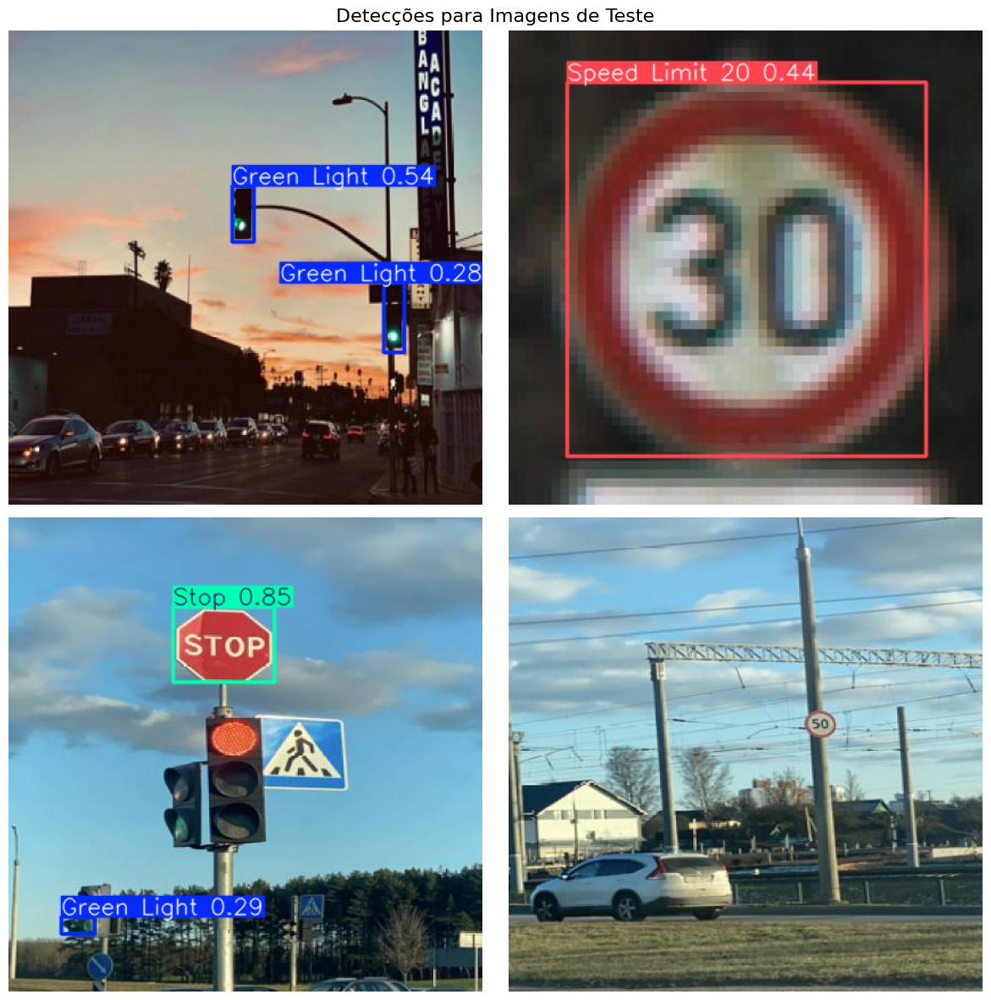

In [290]:
img1 = Image.open('car/test/images/road11_png.rf.40b76142a629faa238c042bcb209cc27.jpg')
img2 = Image.open('car/test/images/00001_00025_00025_png.rf.9556a94e4da441bd05e548d86099c3c0.jpg')
img3 = Image.open('car/test/images/road822_png.rf.b3ba7f5457042a083bad8aac3fe5f819.jpg')
img4 = Image.open('car/test/images/road774_png.rf.01952886ddecdd8280c5df688e7f3f0e.jpg')

fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for i, img in enumerate([img1, img2, img3, img4]):
    # plt.figure(figsize=(8, 8))
    result = model.predict(img, conf=0.25)[0]
    im_array_bgr = result.plot()
    im_array_rgb = im_array_bgr[..., ::-1]
    axes[i//2, i%2].imshow(im_array_rgb)
    axes[i//2, i%2].axis('off')
fig.suptitle('Detecções para Imagens de Teste', fontsize=16)
plt.tight_layout()
plt.axis('off') 
plt.show() 

## Segunda Otimização

In [ ]:
# Initialize the YOLO model
model = YOLO("models/yolo11n.pt")

# Define search space
search_space = {
    "lr0": (1e-3, 1e-1),
    "degrees": (0.0, 15.0),
    'hsv_h': (0.0, 0.03),
}

# Tune hyperparameters on COCO8 for 30 epochs
model.tune(
    data='car/data.yaml',
    epochs=10,
    imgsz=640, 
    batch=4,
    iterations=100,
    optimizer="AdamW",
    space=search_space,
    project='yolo-trafic-sign', 
    name='yolo11n-tuned2', 
    exist_ok=True, 
    device='cuda', 
    workers=2,
    resume=True
)

Tuner: Initialized Tuner instance with 'tune_dir=F:\Tuga\Faculdade\doc\Deep Learning\Tarefa 2\yolo-trafic-sign\yolo11n-tuned2'
Tuner:  Learn about tuning at https://docs.ultralytics.com/guides/hyperparameter-tuning
Tuner: Resuming tuning run F:\Tuga\Faculdade\doc\Deep Learning\Tarefa 2\yolo-trafic-sign\yolo11n-tuned2 from iteration 71...
Tuner: Starting iteration 71/100 with hyperparameters: {'lr0': 0.00404, 'degrees': 0.0, 'hsv_h': 0.01449}


In [291]:
model = YOLO("yolo-trafic-sign/yolo11n-tuned2/weights/best.pt")

In [294]:
model.val(project='yolo-trafic-sign', name='yolo11n-tuned2', exist_ok=True, device='cuda', workers=2)

Ultralytics 8.3.204  Python-3.13.7 torch-2.8.0+cu128 CUDA:0 (NVIDIA GeForce GTX 1660, 6144MiB)
val: Fast image access  (ping: 0.00.0 ms, read: 204.891.7 MB/s, size: 17.7 KB)
val: Scanning F:\Tuga\Faculdade\doc\Deep Learning\Tarefa 2\car\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 801/801 1.2Mit/s 0.0s0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 51/51 6.6it/s 7.7s0.1s
                   all        801        944      0.655       0.58      0.638      0.533
           Green Light         87        122      0.644      0.549      0.586      0.312
             Red Light         74        108       0.56      0.676      0.611      0.327
       Speed Limit 100         52         52      0.517      0.453      0.541      0.498
       Speed Limit 110         17         17      0.476      0.321      0.451      0.408
       Speed Limit 120         60         60      0.496      0.533      0.566      0.

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001D5B68E7D90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   


0: 640x640 2 Green Lights, 9.3ms
Speed: 4.1ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 20, 1 Speed Limit 30, 9.1ms
Speed: 3.3ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 1 Stop, 8.9ms
Speed: 4.1ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 8.4ms
Speed: 2.7ms preprocess, 8.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


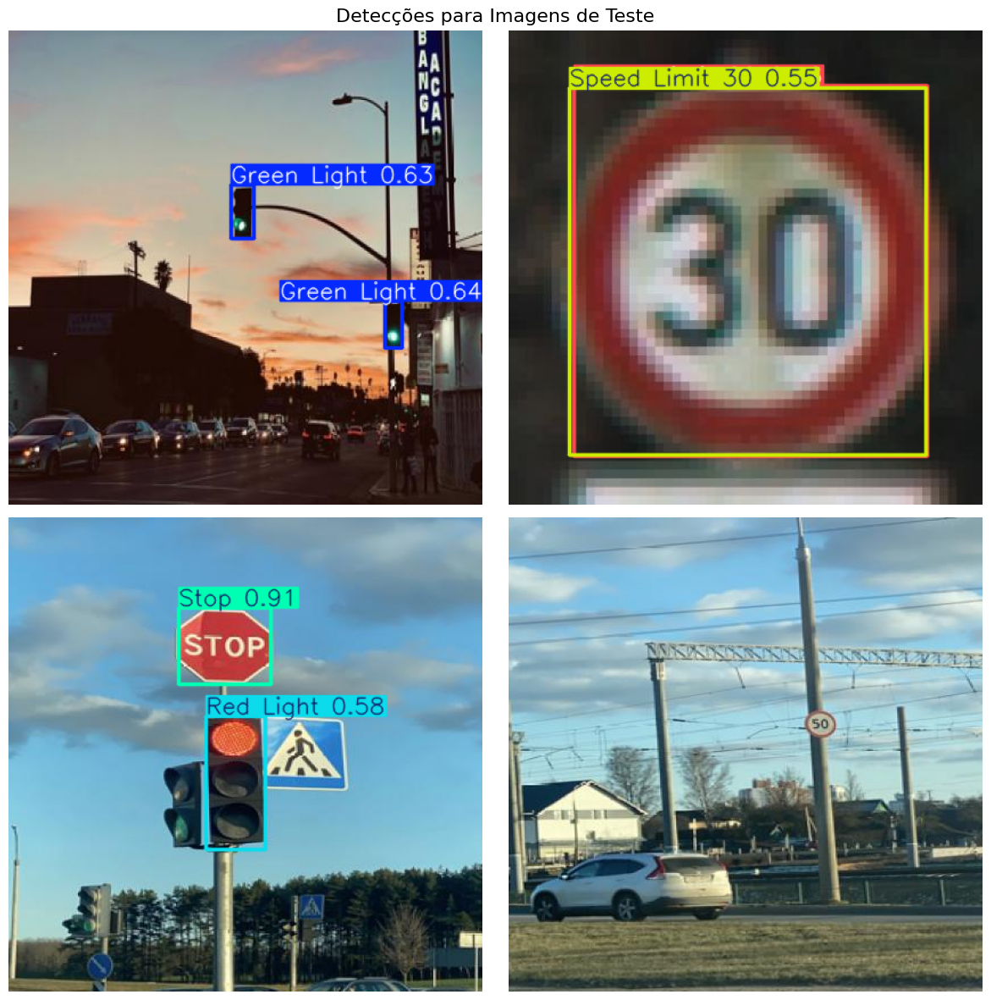

In [292]:
img1 = Image.open('car/test/images/road11_png.rf.40b76142a629faa238c042bcb209cc27.jpg')
img2 = Image.open('car/test/images/00001_00025_00025_png.rf.9556a94e4da441bd05e548d86099c3c0.jpg')
img3 = Image.open('car/test/images/road822_png.rf.b3ba7f5457042a083bad8aac3fe5f819.jpg')
img4 = Image.open('car/test/images/road774_png.rf.01952886ddecdd8280c5df688e7f3f0e.jpg')

fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for i, img in enumerate([img1, img2, img3, img4]):
    # plt.figure(figsize=(8, 8))
    result = model.predict(img, conf=0.25)[0]
    im_array_bgr = result.plot()
    im_array_rgb = im_array_bgr[..., ::-1]
    axes[i//2, i%2].imshow(im_array_rgb)
    axes[i//2, i%2].axis('off')
fig.suptitle('Detecções para Imagens de Teste', fontsize=16)
plt.tight_layout()
plt.axis('off') 
plt.show() 

# Otimização Manual

In [22]:
scales = [0.4, 0.6, 0.7]

In [24]:
for scale in scales:
    print(f"Treinando com escala de imagem: {scale}")
    model = YOLO("models/yolo11n.pt")
    model.train(data='car/data.yaml', epochs=30, imgsz=640, batch=4, scale=scale, project='yolo-trafic-sign', name=f'yolo11n-custom-scale-{scale}', exist_ok=True, device='cuda', workers=2)

Treinando com escala de imagem: 0.4
New https://pypi.org/project/ultralytics/8.3.208 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.204  Python-3.13.7 torch-2.8.0+cu128 CUDA:0 (NVIDIA GeForce GTX 1660, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=car/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=models/yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yo

In [3]:
scales = [0.525, 0.55, 0.575]

In [4]:
for scale in scales:
    print(f"Treinando com escala de imagem: {scale}")
    model = YOLO("models/yolo11n.pt")
    model.train(data='car/data.yaml', epochs=30, imgsz=640, batch=4, scale=scale, project='yolo-trafic-sign', name=f'yolo11n-custom-scale-{scale}', exist_ok=True, device='cuda', workers=2)

Treinando com escala de imagem: 0.525
New https://pypi.org/project/ultralytics/8.3.209 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.204  Python-3.13.7 torch-2.8.0+cu128 CUDA:0 (NVIDIA GeForce GTX 1660, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=car/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=models/yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=

In [3]:
perspectives = [0.0001, 0.0003, 0.0005]
for perpective in perspectives:
    print(f"Treinando com escala de imagem: {perpective}")
    model = YOLO("models/yolo11n.pt")
    model.train(data='car/data.yaml', epochs=30, imgsz=640, batch=4, perspective=perpective, project='yolo-trafic-sign', name=f'yolo11n-custom-perspective-{perpective}', exist_ok=True, device='cuda', workers=2)

Treinando com escala de imagem: 0.0001
New https://pypi.org/project/ultralytics/8.3.214 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.204  Python-3.13.7 torch-2.8.0+cu128 CUDA:0 (NVIDIA GeForce GTX 1660, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=car/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=models/yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name

# GradCAM

In [75]:
model = YOLO("yolo-trafic-sign/yolo11n-custom/weights/best.pt")

In [105]:
from pytorch_grad_cam import EigenCAM, GradCAM, ScoreCAM, EigenGradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import torch
from torchvision import transforms
import numpy as np

In [88]:
MODEL_PATH = 'yolo-trafic-sign/yolo11n-custom/weights/best.pt'
IMG_SIZE = 416
NUM_CLASSES = 15 # Se a sua deteção tiver apenas 1 classe (placa)
TARGET_CLASS_INDEX = 1 # O índice da classe que você quer visualizar (Ajuste se for um valor fixo como 0)

# Carregar o modelo YOLO e extrair o torch.nn.Module
yolo_model = YOLO(MODEL_PATH)
model = yolo_model.model 
model.eval()

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)), 
    transforms.ToTensor(), 
])
target_layers = [model.model[-2]]


0: 640x640 5 Green Lights, 8.7ms
Speed: 3.6ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 1 Speed Limit 80, 9.0ms
Speed: 2.5ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Red Lights, 1 Stop, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 13.4ms
Speed: 4.0ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


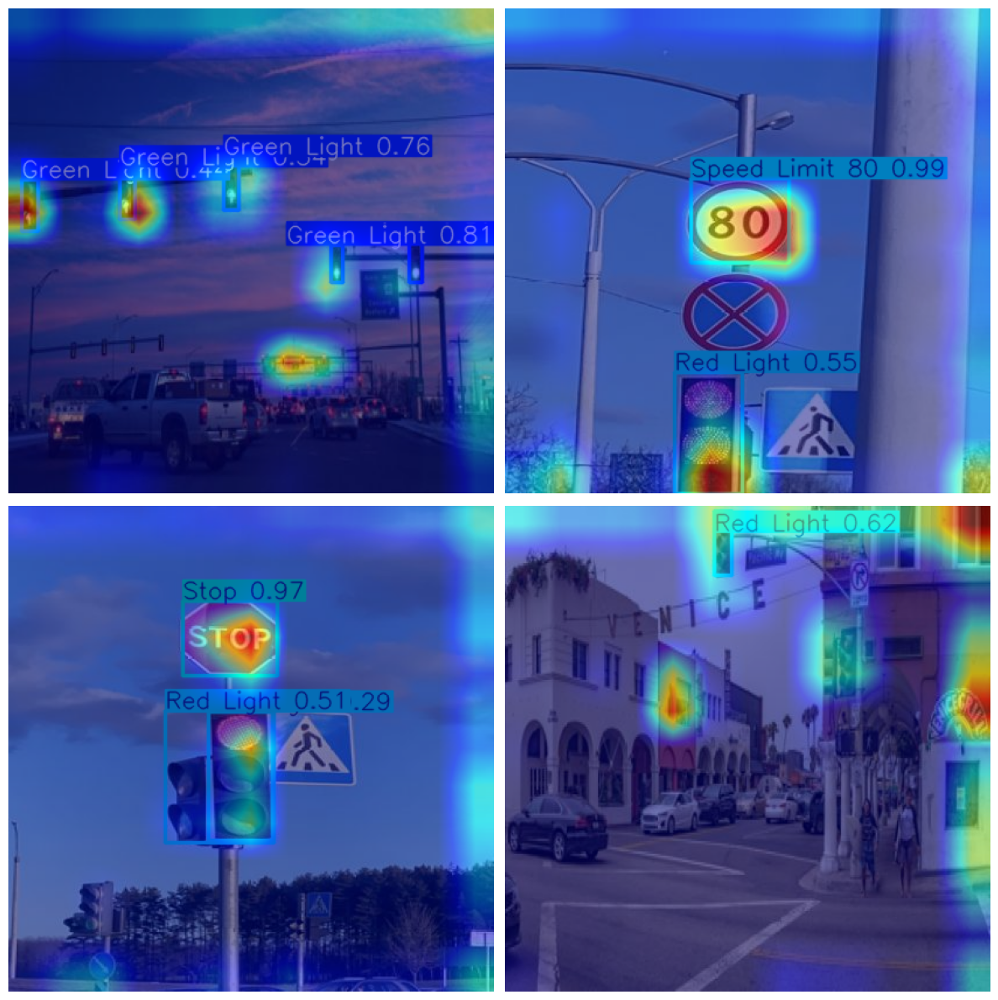

In [107]:
img1 = 'car/test/images/road43_png.rf.c576096fc5f0b00379321f94ddffcbc6.jpg'
img2 = 'car/test/images/road459_png.rf.90e8843192d53e6f83e48ef5a09736a3.jpg'
img3 = 'car/test/images/road822_png.rf.b3ba7f5457042a083bad8aac3fe5f819.jpg'
img4 = 'car/test/images/road28_png.rf.d0de3563c76ae8b60ecdaf41757d472b.jpg'
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
for i, img_str in enumerate([img1, img2, img3, img4]):
    # plt.figure(figsize=(8, 8))
    img = Image.open(img_str)

    input_tensor = transform(img).unsqueeze(0) 
    input_tensor = torch.autograd.Variable(input_tensor, requires_grad=True)
    
    # results = model(input_tensor)

    result = yolo_model.predict(img, conf=0.25)[0]
    im_array_bgr = result.plot()
    im_array_rgb = im_array_bgr[..., ::-1]

    cam = EigenCAM(model, target_layers)
    grayscale_cam = cam(input_tensor, [ClassifierOutputTarget(0)])[0, :, :]
    img_np = np.array(im_array_rgb, dtype=np.float32) / 255
    cam_image = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)
    im_array_rgb = Image.fromarray(cam_image)


    # im_array_rgb = im_array_bgr[..., ::-1]
    axes[i//2, i%2].imshow(im_array_rgb)
    axes[i//2, i%2].axis('off')
plt.tight_layout()
plt.axis('off')
plt.show()



0: 640x640 1 Speed Limit 20, 9.8ms
Speed: 3.1ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 30, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 9.9ms
Speed: 2.7ms preprocess, 9.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Green Light, 1 Red Light, 8.3ms
Speed: 5.3ms preprocess, 8.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


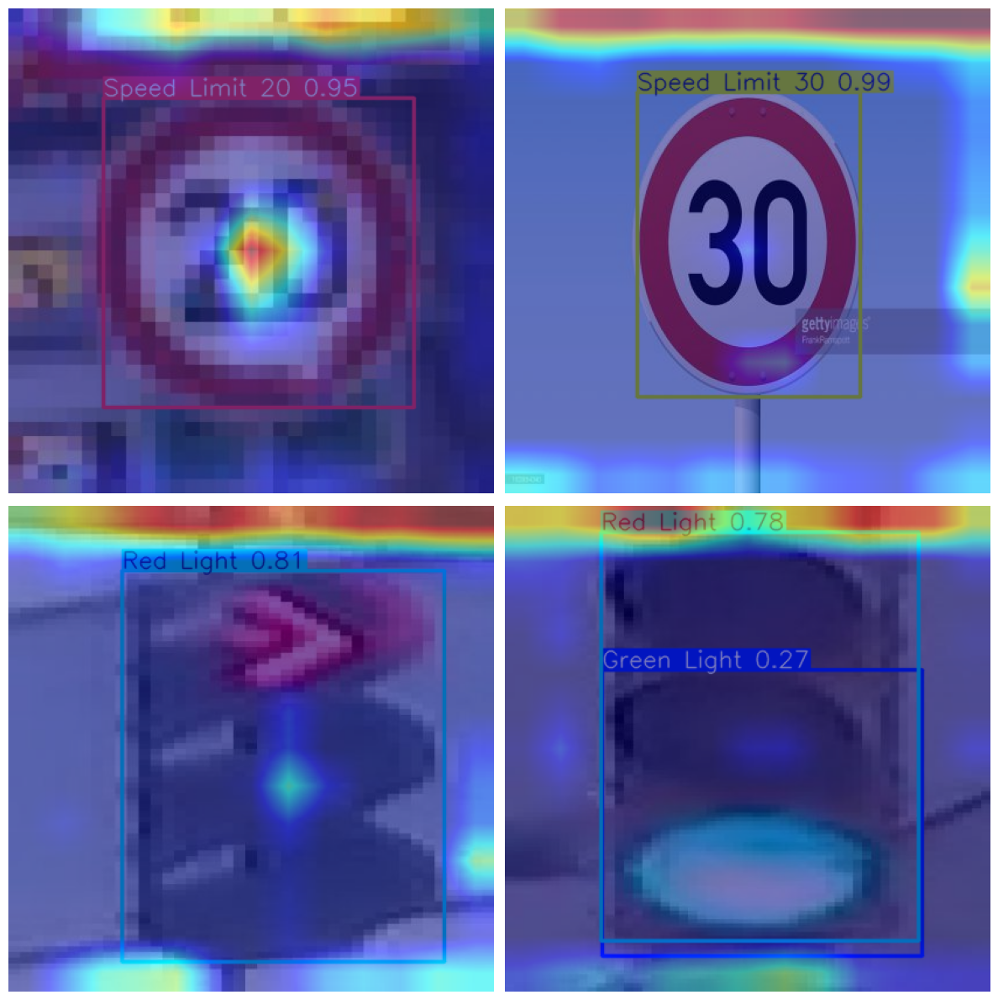

In [103]:
img1 = 'car/test/images/00000_00000_00008_png.rf.ff305dcd6e9ceb9188937311a4a1b207.jpg'
img2 = 'car/test/images/000003_jpg.rf.8511b9c219dbf9799a6d58900b15917d.jpg'
img3 = 'car/test/images/0313fdea-c8b1-458b-adac-adcb4aac3622_jpg.rf.78780f33ec642080187f26937e8005be.jpg'
img4 = 'car/test/images/b413caec-028d-48e6-922b-fc63db1b7ebb_jpg.rf.259a6b31980f35168c8ec00a5e80c263.jpg'
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
for i, img_str in enumerate([img1, img2, img3, img4]):
    # plt.figure(figsize=(8, 8))
    img = Image.open(img_str)

    input_tensor = transform(img).unsqueeze(0) 
    input_tensor = torch.autograd.Variable(input_tensor, requires_grad=True)
    
    # results = model(input_tensor)

    result = yolo_model.predict(img, conf=0.25)[0]
    im_array_bgr = result.plot()
    im_array_rgb = im_array_bgr[..., ::-1]

    cam = EigenCAM(model, target_layers)
    grayscale_cam = cam(input_tensor, [ClassifierOutputTarget(1)])[0, :, :]
    img_np = np.array(im_array_rgb, dtype=np.float32) / 255
    cam_image = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)
    im_array_rgb = Image.fromarray(cam_image)


    # im_array_rgb = im_array_bgr[..., ::-1]
    axes[i//2, i%2].imshow(im_array_rgb)
    axes[i//2, i%2].axis('off')
plt.tight_layout()
plt.axis('off')
plt.show()


# Verificação frente a fotos reais

In [3]:
model = YOLO("yolo-trafic-sign/yolo11n-custom/weights/best.pt")

In [14]:
files = os.listdir('images/')


0: 512x640 1 Stop, 6.8ms
Speed: 1.9ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

0: 640x512 1 Red Light, 10.7ms
Speed: 3.1ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 512)

0: 640x512 1 Speed Limit 70, 7.6ms
Speed: 3.2ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 512)

0: 512x640 1 Red Light, 9.9ms
Speed: 3.0ms preprocess, 9.9ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)

0: 512x640 (no detections), 7.6ms
Speed: 3.4ms preprocess, 7.6ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 640)

0: 512x640 (no detections), 8.7ms
Speed: 3.6ms preprocess, 8.7ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)


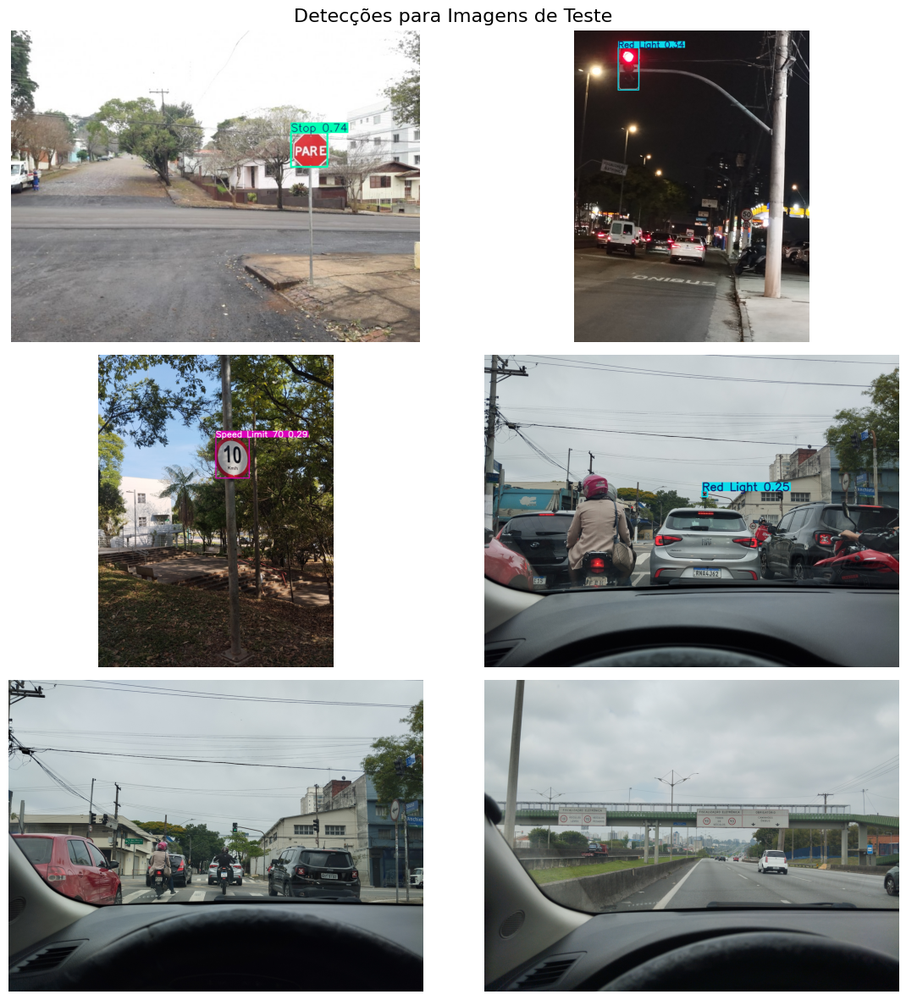

In [15]:

fig, axes = plt.subplots(3, 2, figsize=(12, 12))

for i, img in enumerate(files):
    # plt.figure(figsize=(8, 8))
    img = cv2.imread(f'images/{img}')
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result = model.predict(img, conf=0.25)[0]
    im_array_bgr = result.plot()
    im_array_rgb = im_array_bgr[..., ::-1]
    axes[i//2, i%2].imshow(im_array_rgb)
    axes[i//2, i%2].axis('off')

fig.suptitle('Detecções para Imagens de Teste', fontsize=16)
plt.tight_layout()
plt.axis('off') 
plt.show() 